# March Madness 2024-25 EDA

This project explores data from the 2024-25 NCAA Men's Basketball season in preparation for March Madness. To that end, data from a cleaned Kaggle dataset is provided below and explored in detail. The goal of this repo is to provide ML models capable of predicting the winners of March Madness games given any two pairings of teams and potentially a whole bracket. You can find the bracket for the 2023-24 season below for reference. 

![Alt text](https://www.ncaa.com/_flysystem/public-s3/images/2024/12/06/2024-ncaa-tournament-bracket.jpg)

## Initializing

In [4]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

## Preprocessing

In [5]:
df = pd.read_csv('/Downloads/archive (14)/DEV _ March Madness.csv')

Several additional files are included in the Github repo and the original Kaggle dataset. The description provided in Kaggle lists this file as the place where the cleaned and processed data from the other files was deposited.

In [6]:
set(df.dtypes)

{dtype('int64'), dtype('float64'), dtype('O')}

In [7]:
pd.set_option('display.max_info_rows', 150)
pd.set_option('display.max_info_columns', 150)

Given the size of the dataset, it requires us to change the output settings so we can get all the columns and their types.

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8315 entries, 0 to 8314
Data columns (total 147 columns):
 #    Column                                Dtype  
---   ------                                -----  
 0    Season                                int64  
 1    Short Conference Name                 object 
 2    Adjusted Temo                         float64
 3    Adjusted Tempo Rank                   int64  
 4    Raw Tempo                             float64
 5    Raw Tempo Rank                        int64  
 6    Adjusted Offensive Efficiency         float64
 7    Adjusted Offensive Efficiency Rank    int64  
 8    Raw Offensive Efficiency              float64
 9    Raw Offensive Efficiency Rank         int64  
 10   Adjusted Defensive Efficiency         float64
 11   Adjusted Defensive Efficiency Rank    int64  
 12   Raw Defensive Efficiency              float64
 13   Raw Defensive Efficiency Rank         int64  
 14   Avg Possession Length (Offense)       float64
 15   Av

In [10]:
pd.set_option('display.max_columns', 150)
df.head()

,Season,Short Conference Name,Adjusted Temo,Adjusted Tempo Rank,Raw Tempo,Raw Tempo Rank,Adjusted Offensive Efficiency,Adjusted Offensive Efficiency Rank,Raw Offensive Efficiency,Raw Offensive Efficiency Rank,Adjusted Defensive Efficiency,Adjusted Defensive Efficiency Rank,Raw Defensive Efficiency,Raw Defensive Efficiency Rank,Avg Possession Length (Offense),Avg Possession Length (Offense) Rank,Avg Possession Length (Defense),Avg Possession Length (Defense) Rank,eFGPct,RankeFGPct,TOPct,RankTOPct,ORPct,RankORPct,FTRate,RankFTRate,OffFT,RankOffFT,Off2PtFG,RankOff2PtFG,Off3PtFG,RankOff3PtFG,DefFT,RankDefFT,Def2PtFG,RankDef2PtFG,Def3PtFG,RankDef3PtFG,Tempo,RankTempo,AdjTempo,RankAdjTempo,OE,RankOE,AdjOE,RankAdjOE,DE,RankDE,AdjDE,RankAdjDE,AdjEM,RankAdjEM,FG2Pct,RankFG2Pct,FG3Pct,RankFG3Pct,FTPct,RankFTPct,BlockPct,RankBlockPct,OppFG2Pct,RankOppFG2Pct,OppFG3Pct,RankOppFG3Pct,OppFTPct,RankOppFTPct,OppBlockPct,RankOppBlockPct,FG3Rate,RankFG3Rate,OppFG3Rate,RankOppFG3Rate,ARate,RankARate,OppARate,RankOppARate,StlRate,RankStlRate,OppStlRate,RankOppStlRate,DFP,NSTRate,RankNSTRate,OppNSTRate,RankOppNSTRate,AvgHeight,RankAvgHeight,CenterHeight,RankCenterHeight,PFHeight,RankPFHeight,SFHeight,RankSFHeight,SGHeight,RankSGHeight,PGHeight,RankPGHeight,EffectiveHeight,RankEffectiveHeight,Experience,RankExperience,Bench,BenchRank,CenterPts,RankCenterPts,PFPts,RankPFPts,SFPts,RankSFPts,SGPts,RankSGPts,PGPts,RankPGPts,CenterOR,RankCenterOR,PFOR,RankPFOR,SFOR,RankSFOR,SGOR,RankSGOR,PGOR,RankPGOR,CenterDR,RankCenterDR,PFDR,RankPFDR,SFDR,RankSFDR,SGDR,RankSGDR,PGDR,RankPGDR,Net Rating,Net Rating Rank,Mapped Conference Name,Mapped ESPN Team Name,Current Coach,Full Team Name,Since,Active Coaching Length,Active Coaching Length Index,Seed,Region,Post-Season Tournament,Post-Season Tournament Sorting Index,Top 12 in AP Top 25 During Week 6?
0,2025,ACC,66.1,262,66.4,270,128.9,2,125.3,1,89.8,4,92.1,2,17.0,107.0,19.1,363.0,57.663170,5,14.068787,15,35.351351,30,32.284382,195,17.951907,245,44.859038,318,37.189055,53,17.146080,286,50.197406,157,32.656514,127,66.4224,270,66.0647,262,125.295,1,128.900,2,92.1327,2,89.8200,4,39.0800,1,57.492030,14,38.580645,10,78.158845,22,10.097087,127,43.203883,3,30.537975,28,71.361502,144,9.989373,249,45.163170,57,38.026474,144,59.404762,35,52.821317,205,0.104867,117,0.081506,31,NaN,5.918235,23.0,7.475665,198.0,79.77,1.0,2.61,10.0,1.57,36.0,1.47,28.0,2.68,2.0,4.50,1.0,2.09,10.0,1.92886,132.0,31.37,174.0,14.95,322.0,27.70,8.0,22.78,81.0,15.96,329.0,18.61,230.0,47.93,18.0,18.46,320.0,11.02,313.0,13.35,112.0,9.23,145.0,24.65,221.0,27.58,59.0,14.13,343.0,19.95,58.0,13.69,212.0,39.1,1,Atlantic Coast Conference (ACC),Duke,Jon Scheyer,Duke Blue Devils,202223.0,2 years,3.0,Not In a Post-Season Tournament,Not In a Post-Season Tournament,Not In a Post-Season Tournament,5,Yes
1,2025,SEC,68.6,121,69.4,111,130.7,1,122.9,2,93.1,10,99.2,34,17.1,117.0,17.7,202.0,56.048835,20,13.025510,4,35.151515,34,33.962264,148,18.449738,209,48.607186,210,32.943076,140,23.871615,14,50.852558,125,25.275827,349,69.3599,111,68.5649,121,122.919,2,130.745,1,99.2172,34,93.1002,10,37.6449,2,56.367041,30,37.057221,37,74.673203,92,16.955333,3,46.216955,22,29.370629,8,72.894334,232,7.677903,48,40.732519,134,34.272019,35,54.576659,105,39.407407,5,0.101420,140,0.086505,73,NaN,4.374981,1.0,7.258491,220.0,78.40,32.0,1.10,71.0,0.45,117.0,1.43,32.0,1.99,13.0,1.01,88.0,0.78,77.0,2.78964,25.0,34.05,114.0,20.79,119.0,21.18,128.0,18.75,209.0,19.16,246.0,20.11,175.0,46.68,24.0,29.38,116.0,12.57,286.0,5.89,326.0,5.43,308.0,30.35,61.0,24.43,138.0,16.91,260.0,16.11,185.0,12.18,296.0,37.6,2,Southeastern Conference (SEC),Auburn,Bruce Pearl,Auburn Tigers,201415.0,10 years,11.0,Not In a Post-Season Tournament,Not In a Post-Season Tournament,Not In a Post-Season Tournament,5,Yes
2,2015,SEC,62.4,274,63.8,242,121.3,6,115.5,9,84.4,1,84.7,1,17.7,98.0,19.6,327.0,51.511600,75,16.252900,32,39.501200,8,43.860500,31,23.620700,45,55.379300,54,21.000000,326,20.916000,161,54.296500,57,24.787500,301,6

The data seems to have loaded correctly. Given the amount of fields and the reality that I am not familiar with all these statistical features, it's possible that an object should be an double or vise versa. The dataset's data dictionary was consulted while inspecting these fields.

In [12]:
df.duplicated().sum()

0

In [13]:
df.dropna().reset_index(drop=True).shape

(0, 147)

All rows have null values in them.

In [15]:
pd.set_option('display.max_columns', 150)
null_columns = pd.DataFrame(df.isna().sum() / len(df)).T.loc[:, (pd.DataFrame(df.isna().sum() / len(df)).T != 0).all()]
print('Number of columns with nulls:', len(null_columns.columns))
null_columns

Number of columns with nulls: 62


,Avg Possession Length (Offense),Avg Possession Length (Offense) Rank,Avg Possession Length (Defense),Avg Possession Length (Defense) Rank,DFP,NSTRate,RankNSTRate,OppNSTRate,RankOppNSTRate,AvgHeight,RankAvgHeight,CenterHeight,RankCenterHeight,PFHeight,RankPFHeight,SFHeight,RankSFHeight,SGHeight,RankSGHeight,PGHeight,RankPGHeight,EffectiveHeight,RankEffectiveHeight,Experience,RankExperience,Bench,BenchRank,CenterPts,RankCenterPts,PFPts,RankPFPts,SFPts,RankSFPts,SGPts,RankSGPts,PGPts,RankPGPts,CenterOR,RankCenterOR,PFOR,RankPFOR,SFOR,RankSFOR,SGOR,RankSGOR,PGOR,RankPGOR,CenterDR,RankCenterDR,PFDR,RankPFDR,SFDR,RankSFDR,SGDR,RankSGDR,PGDR,RankPGDR,Current Coach,Full Team Name,Since,Active Coaching Length,Active Coaching Length Index
0,0.320505,0.320505,0.320505,0.320505,0.873001,0.740589,0.740589,0.740589,0.740589,0.197715,0.197715,0.197715,0.197715,0.197715,0.197715,0.197715,0.197715,0.197715,0.197715,0.197715,0.197715,0.197715,0.197715,0.197715,0.197715,0.197715,0.197715,0.197715,0.197715,0.197715,0.197715,0.197715,0.197715,0.197715,0.197715,0.197715,0.197715,0.197715,0.197715,0.197715,0.197715,0.197715,0.197715,0.197715,0.197715,0.197715,0.197715,0.197715,0.197715,0.197715,0.197715,0.197715,0.197715,0.197715,0.197715,0.197715,0.197715,0.009982,0.009982,0.009982,0.009982,0.009982


The series was converted into wide data for an easier read in the above cell. Significant percentages from most of these fields are missing.

In [17]:
# df.fillna(value=0)

In [18]:
set(df.dtypes)

{dtype('int64'), dtype('float64'), dtype('O')}

In [20]:
df.columns = [col.lower().replace(' ', '_') for col in df.columns]

Code makes all columns lowercase and replaces any spaces with an underscore, as confirmed in the next cell.

In [22]:
df.columns

Index(['season', 'short_conference_name', 'adjusted_temo',
       'adjusted_tempo_rank', 'raw_tempo', 'raw_tempo_rank',
       'adjusted_offensive_efficiency', 'adjusted_offensive_efficiency_rank',
       'raw_offensive_efficiency', 'raw_offensive_efficiency_rank',
       ...
       'current_coach', 'full_team_name', 'since', 'active_coaching_length',
       'active_coaching_length_index', 'seed', 'region',
       'post-season_tournament', 'post-season_tournament_sorting_index',
       'top_12_in_ap_top_25_during_week_6?'],
      dtype='object', length=147)

The data and libraries have been successfully loaded and the nulls inspected. The columns were made into lowercase as well, so we will move onto the Exploratory Data Analysis (EDA) of this project.

## EDA

In [29]:
df = df.query('season==2025').reset_index(drop=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 364 entries, 0 to 363
Data columns (total 147 columns):
 #    Column                                Dtype  
---   ------                                -----  
 0    season                                int64  
 1    short_conference_name                 object 
 2    adjusted_temo                         float64
 3    adjusted_tempo_rank                   int64  
 4    raw_tempo                             float64
 5    raw_tempo_rank                        int64  
 6    adjusted_offensive_efficiency         float64
 7    adjusted_offensive_efficiency_rank    int64  
 8    raw_offensive_efficiency              float64
 9    raw_offensive_efficiency_rank         int64  
 10   adjusted_defensive_efficiency         float64
 11   adjusted_defensive_efficiency_rank    int64  
 12   raw_defensive_efficiency              float64
 13   raw_defensive_efficiency_rank         int64  
 14   avg_possession_length_(offense)       float64
 15   avg_

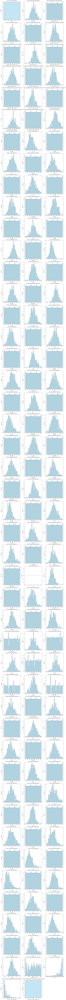

In [31]:
numeric_columns = df.select_dtypes(include=['number']).columns  # Select only numeric columns

# Set up the number of rows and columns for subplots
n = len(numeric_columns)
cols = 3  # Number of columns for subplots
rows = (n + cols - 1) // cols  # Calculate the number of rows needed

# Create the figure and axes
fig, axes = plt.subplots(rows, cols, figsize=(15, 5 * rows))
axes = axes.flatten()  # Flatten the axes array to make it easier to iterate
i = 0 

# Plot a histogram for each numeric column
for i, col in enumerate(numeric_columns):
    bins = 30
    if df[col].nunique() < bins and df[col].nunique() >= 1:
        bins = df[col].nunique()
    sns.histplot(df[col], kde=True, ax=axes[i], bins=bins, color='skyblue', edgecolor='black')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Frequency')
    axes[i].set_title(f'Field {i}: {col.title()} Distribution')

# Hide any extra subplots if the numeric columns are not divisible by three.
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Adjust the layout to ensure there's no overlap
plt.tight_layout()

# Show the figure
plt.show()

In [35]:
df.describe()

,season,adjusted_temo,adjusted_tempo_rank,raw_tempo,raw_tempo_rank,adjusted_offensive_efficiency,adjusted_offensive_efficiency_rank,raw_offensive_efficiency,raw_offensive_efficiency_rank,adjusted_defensive_efficiency,adjusted_defensive_efficiency_rank,raw_defensive_efficiency,raw_defensive_efficiency_rank,avg_possession_length_(offense),avg_possession_length_(offense)_rank,avg_possession_length_(defense),avg_possession_length_(defense)_rank,efgpct,rankefgpct,topct,ranktopct,orpct,rankorpct,ftrate,rankftrate,offft,rankoffft,off2ptfg,rankoff2ptfg,off3ptfg,rankoff3ptfg,defft,rankdefft,def2ptfg,rankdef2ptfg,def3ptfg,rankdef3ptfg,tempo,ranktempo,adjtempo,rankadjtempo,oe,rankoe,adjoe,rankadjoe,de,rankde,adjde,rankadjde,adjem,rankadjem,fg2pct,rankfg2pct,fg3pct,rankfg3pct,ftpct,rankftpct,blockpct,rankblockpct,oppfg2pct,rankoppfg2pct,oppfg3pct,rankoppfg3pct,oppftpct,rankoppftpct,oppblockpct,rankoppblockpct,fg3rate,rankfg3rate,oppfg3rate,rankoppfg3rate,arate,rankarate,opparate,rankopparate,stlrate,rankstlrate,oppstlrate,rankoppstlrate,dfp,nstrate,ranknstrate,oppnstrate,rankoppnstrate,avgheight,rankavgheight,centerheight,rankcenterheight,pfheight,rankpfheight,sfheight,ranksfheight,sgheight,ranksgheight,pgheight,rankpgheight,effectiveheight,rankeffectiveheight,experience,rankexperience,bench,benchrank,centerpts,rankcenterpts,pfpts,rankpfpts,sfpts,ranksfpts,sgpts,ranksgpts,pgpts,rankpgpts,centeror,rankcenteror,pfor,rankpfor,sfor,ranksfor,sgor,ranksgor,pgor,rankpgor,centerdr,rankcenterdr,pfdr,rankpfdr,sfdr,ranksfdr,sgdr,ranksgdr,pgdr,rankpgdr,net_rating,net_rating_rank,since,active_coaching_length_index,post-season_tournament_sorting_index
count,364.0,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,3.640000e+02,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,0.0,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.0
mean,2025.0,67.503846,182.500000,68.055769,182.500000,107.344231,182.500000,106.105769,182.500000,107.343681,182.500000,106.201648,182.500000,17.634890,182.500000,17.603571,182.500000,50.883101,182.494505,17.362813,182.500000,29.751519,182.489011,33.076727,182.497253,18.953957,182.491758,49.567260,182.497253,31.478024,182.500000,18.965629,182.500000,49.494820,182.500000,31.538763,182.500000,68.054362,182.500000,67.502827,182.500000,106.107987,182.500000,107.350746,182.500000,106.200722,182.500000,107.350751,182.500000,-1.740934e-07,182.500000,51.113282,182.491758,33.733833,182.478022,72.080960,182.478022,9.366994,182.489011,51.083858,182.491758,33.814613,182.469780,72.122591,182.483516,9.410132,182.486264,39.022333,182.497253,39.070824,182.497253,51.836572,182.489011,52.002439,182.475275,0.097571,182.500000,0.097648,182.500000,NaN,7.598

In [36]:
(df.isna().sum() / len(df)).sort_values(ascending=False)

dfp                                   1.0
season                                0.0
bench                                 0.0
pgheight                              0.0
rankpgheight                          0.0
                                     ... 
rankadjde                             0.0
adjem                                 0.0
rankadjem                             0.0
fg2pct                                0.0
top_12_in_ap_top_25_during_week_6?    0.0
Length: 147, dtype: float64

In [37]:
df = df.drop(columns='dfp')

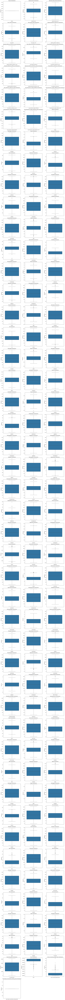

In [38]:
numeric_columns = df.select_dtypes(include=[np.number]).columns  # Select only numeric columns

# Set up the number of rows and columns for subplots
n = len(numeric_columns)
cols = 3  # Number of columns for subplots
rows = (n + cols - 1) // cols  # Calculate the number of rows needed

# Create the figure and axes
fig, axes = plt.subplots(rows, cols, figsize=(15, 5 * rows))
axes = axes.flatten()  # Flatten the axes array to make it easier to iterate
i = 0

# Plot a boxplot for each numeric column
for i, col in enumerate(numeric_columns):
    sns.boxplot(df[col], ax=axes[i], patch_artist=True)  # Specify ax for each boxplot
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Frequency')
    axes[i].set_title(f'{col.title()} Distribution')
    
# Hide any extra subplots if the numeric columns are not divisible by three.
for j in range(i + 1, len(axes)):
   axes[j].axis('off')

# Adjust the layout to ensure there's no overlap
plt.tight_layout()

# Show the figure
plt.show()

Some of these fields do have outliers, but outliers when tracking a societal event are to be expected and do not indicate a concern about the validity or accurateness of the data. Plots that showed no distibution of data and were thus represented by a single line, likely represents the reality that we're only using one year's worth of data.

In [39]:
df.describe()

,season,adjusted_temo,adjusted_tempo_rank,raw_tempo,raw_tempo_rank,adjusted_offensive_efficiency,adjusted_offensive_efficiency_rank,raw_offensive_efficiency,raw_offensive_efficiency_rank,adjusted_defensive_efficiency,adjusted_defensive_efficiency_rank,raw_defensive_efficiency,raw_defensive_efficiency_rank,avg_possession_length_(offense),avg_possession_length_(offense)_rank,avg_possession_length_(defense),avg_possession_length_(defense)_rank,efgpct,rankefgpct,topct,ranktopct,orpct,rankorpct,ftrate,rankftrate,offft,rankoffft,off2ptfg,rankoff2ptfg,off3ptfg,rankoff3ptfg,defft,rankdefft,def2ptfg,rankdef2ptfg,def3ptfg,rankdef3ptfg,tempo,ranktempo,adjtempo,rankadjtempo,oe,rankoe,adjoe,rankadjoe,de,rankde,adjde,rankadjde,adjem,rankadjem,fg2pct,rankfg2pct,fg3pct,rankfg3pct,ftpct,rankftpct,blockpct,rankblockpct,oppfg2pct,rankoppfg2pct,oppfg3pct,rankoppfg3pct,oppftpct,rankoppftpct,oppblockpct,rankoppblockpct,fg3rate,rankfg3rate,oppfg3rate,rankoppfg3rate,arate,rankarate,opparate,rankopparate,stlrate,rankstlrate,oppstlrate,rankoppstlrate,nstrate,ranknstrate,oppnstrate,rankoppnstrate,avgheight,rankavgheight,centerheight,rankcenterheight,pfheight,rankpfheight,sfheight,ranksfheight,sgheight,ranksgheight,pgheight,rankpgheight,effectiveheight,rankeffectiveheight,experience,rankexperience,bench,benchrank,centerpts,rankcenterpts,pfpts,rankpfpts,sfpts,ranksfpts,sgpts,ranksgpts,pgpts,rankpgpts,centeror,rankcenteror,pfor,rankpfor,sfor,ranksfor,sgor,ranksgor,pgor,rankpgor,centerdr,rankcenterdr,pfdr,rankpfdr,sfdr,ranksfdr,sgdr,ranksgdr,pgdr,rankpgdr,net_rating,net_rating_rank,since,active_coaching_length_index,post-season_tournament_sorting_index
count,364.0,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,3.640000e+02,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.0
mean,2025.0,67.503846,182.500000,68.055769,182.500000,107.344231,182.500000,106.105769,182.500000,107.343681,182.500000,106.201648,182.500000,17.634890,182.500000,17.603571,182.500000,50.883101,182.494505,17.362813,182.500000,29.751519,182.489011,33.076727,182.497253,18.953957,182.491758,49.567260,182.497253,31.478024,182.500000,18.965629,182.500000,49.494820,182.500000,31.538763,182.500000,68.054362,182.500000,67.502827,182.500000,106.107987,182.500000,107.350746,182.500000,106.200722,182.500000,107.350751,182.500000,-1.740934e-07,182.500000,51.113282,182.491758,33.733833,182.478022,72.080960,182.478022,9.366994,182.489011,51.083858,182.491758,33.814613,182.469780,72.122591,182.483516,9.410132,182.486264,39.022333,182.497253,39.070824,182.497253,51.836572,182.489011,52.002439,182.475275,0.097571,182.500000,0.097648,182.500000,7.598050,182.5000

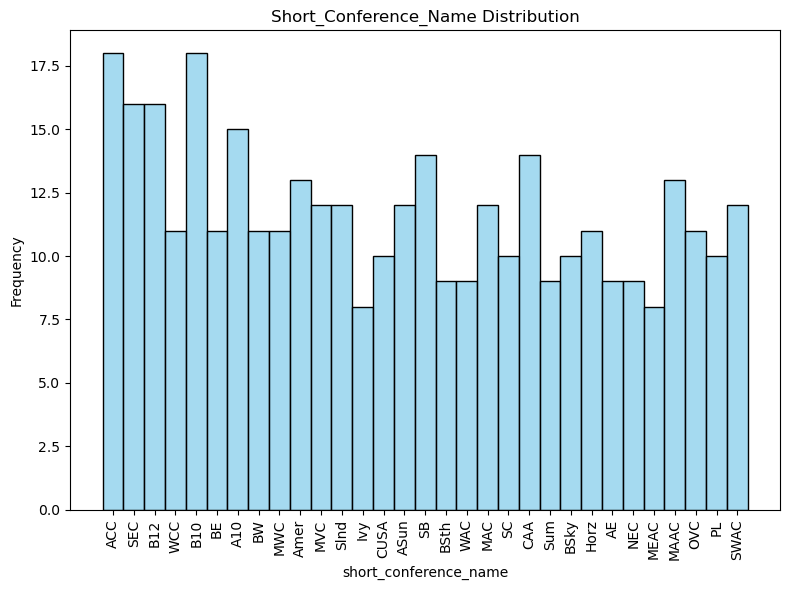

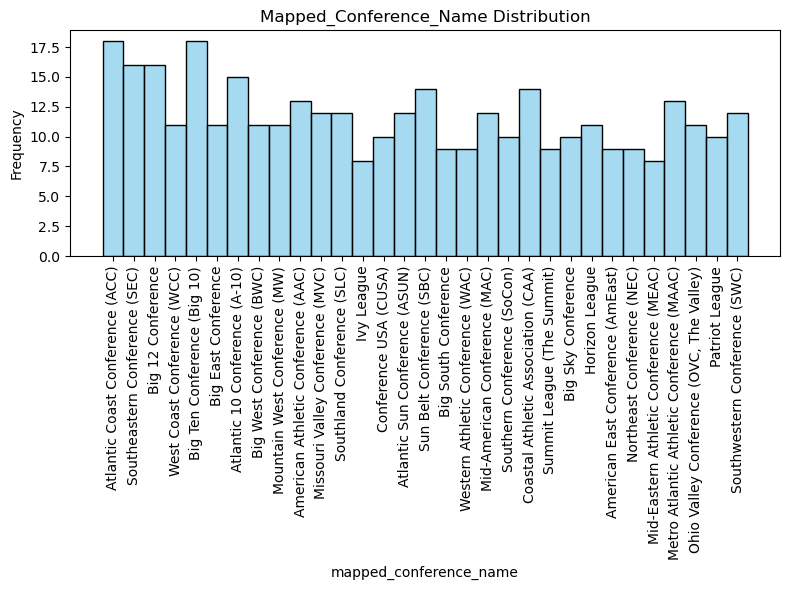

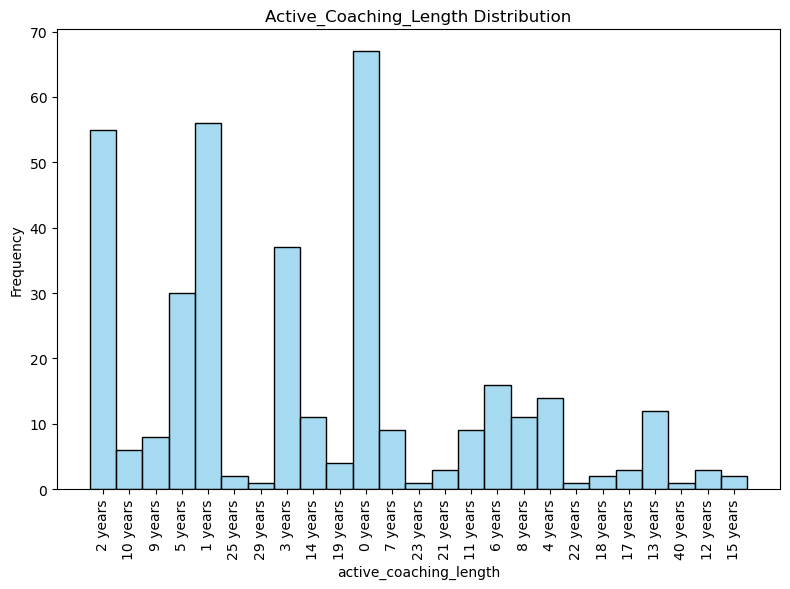

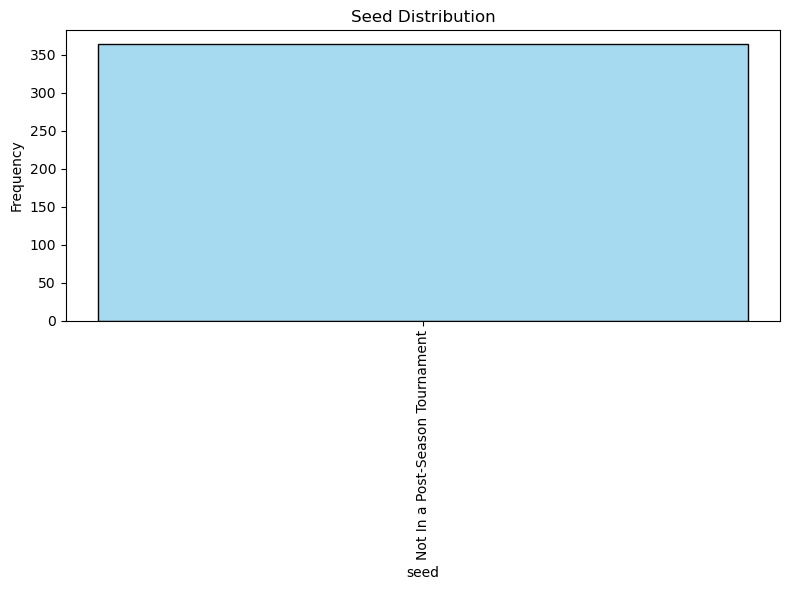

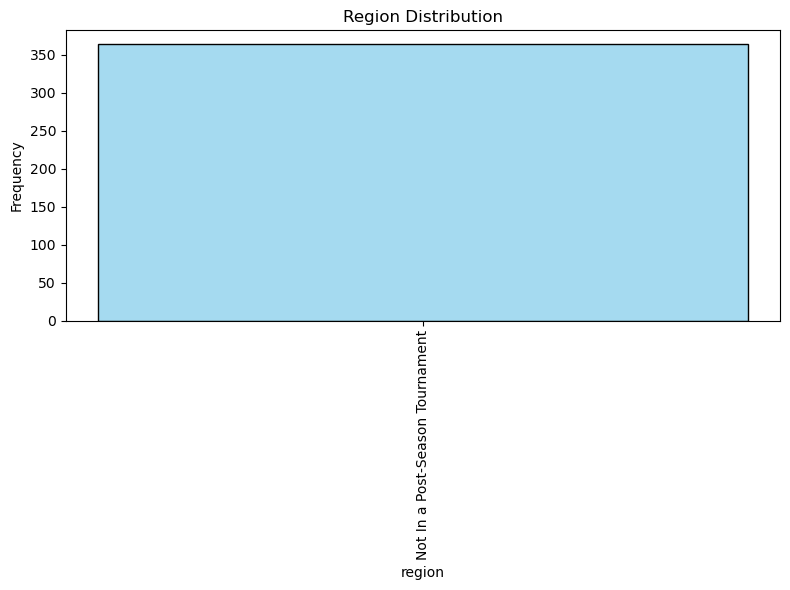

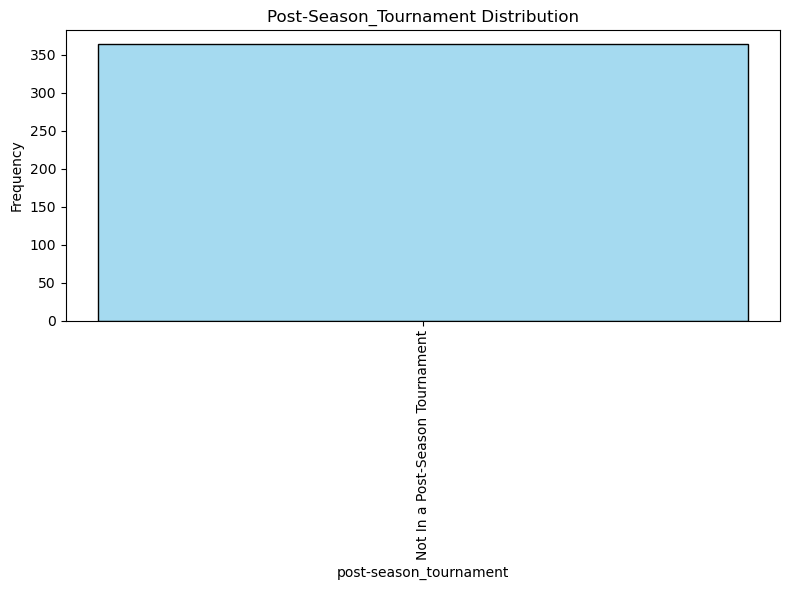

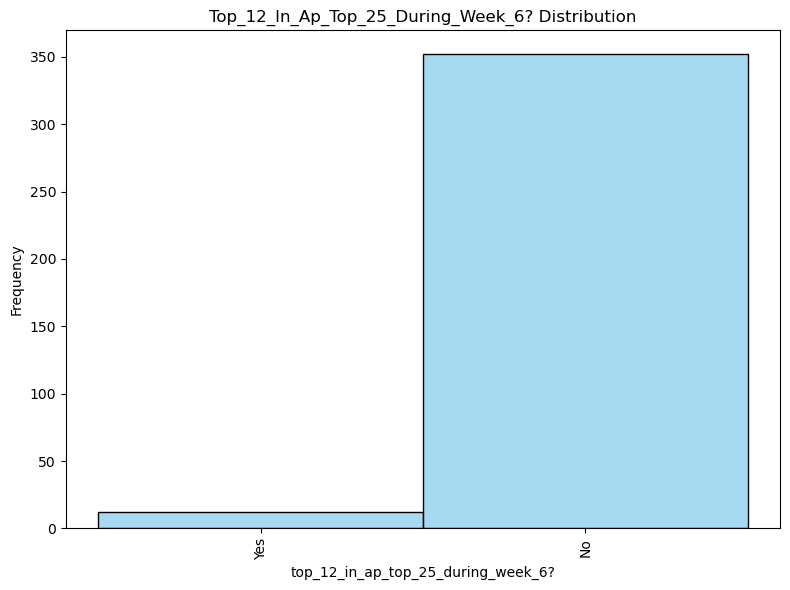

In [43]:
# Select only object columns
object_columns = df.select_dtypes(include=['object']).columns

# Loop through each column and plot one plot at a time
for i, col in enumerate(object_columns):
    if i not in {2, 3, 4}:
        plt.figure(figsize=(8, 6))  # Create a new figure for each plot
        bins = 30
        if df[col].nunique() < bins:
            bins = df[col].nunique()
        
        # Plot the histogram
        sns.histplot(df[col], bins=bins, color='skyblue', edgecolor='black')
        plt.xlabel(col)
        plt.ylabel('Frequency')
        plt.title(f'{col.title()} Distribution')
        
        # Rotate x-axis labels if needed
        plt.xticks(rotation=90)
        
        plt.tight_layout()
        plt.show()  # Loop will display each plot one by one


Each object field was provided with its own plot and blown up given the number of possible values and the fact that unique text values cannot be represented in the same bin together. Some of this data would need to be encoded. Other fields like active_coaching_length can be converted to an int rather easily. But it's easier to just drop the fields not viewed as useful for modeling.

In [48]:
df['full_team_name'].nunique()

364

In [49]:
import plotly.express as px

corr_matrix = df[df.select_dtypes(include=[np.number]).columns].corr()

fig = px.imshow(corr_matrix, color_continuous_scale='RdBu_r', title='Interactive Correlation Heatmap', width=900, height=900)
fig.update_xaxes(side="top")
fig.show()

I don't find the above heatmap particularly helpful, though the fact that the plot is interactive is useful. I include tables for the correllation of these variables below.

In [51]:
threshold = 0.7

strong_correlations = []

# Loop over the correlation matrix and get correlations above the threshold
for i in range(corr_matrix.shape[0]):
    for j in range(i + 1, corr_matrix.shape[1]):  
        if abs(corr_matrix.iloc[i, j]) > threshold:
            strong_correlations.append((corr_matrix.index[i], corr_matrix.columns[j], corr_matrix.iloc[i, j]))

# Show the strong correlations
print("Strong correlations (Above threshold):")

strong_corr_df = pd.DataFrame(strong_correlations, columns=['Feature 1', 'Feature 2', 'Correlation'])
print(strong_corr_df)

Strong correlations (Above threshold):
         Feature 1                             Feature 2  Correlation
0    adjusted_temo                   adjusted_tempo_rank    -0.970646
1    adjusted_temo                             raw_tempo     0.976773
2    adjusted_temo                        raw_tempo_rank    -0.947168
3    adjusted_temo       avg_possession_length_(offense)    -0.894027
4    adjusted_temo  avg_possession_length_(offense)_rank    -0.867826
..             ...                                   ...          ...
307           sfdr                              ranksfdr    -0.969620
308           sgdr                              ranksgdr    -0.965946
309           pgdr                              rankpgdr    -0.969057
310     net_rating                       net_rating_rank    -0.974304
311          since          active_coaching_length_index    -0.999959

[312 rows x 3 columns]


In [52]:
strong_corr_df['Feature 1'].value_counts() [:30]

Feature 1
adjusted_offensive_efficiency         13
raw_offensive_efficiency              13
adjusted_offensive_efficiency_rank    12
raw_offensive_efficiency_rank         12
adjusted_defensive_efficiency         11
avgheight                             10
adjusted_defensive_efficiency_rank    10
adjusted_temo                          9
efgpct                                 9
raw_defensive_efficiency               9
oe                                     9
rankavgheight                          8
rankoe                                 8
rankefgpct                             8
adjusted_tempo_rank                    8
de                                     7
raw_tempo                              7
raw_defensive_efficiency_rank          6
raw_tempo_rank                         6
def2ptfg                               5
topct                                  5
adjoe                                  5
avg_possession_length_(offense)        5
adjde                                  5
off2pt

### Explanation of Columns in the Data:

The following columns have been selected to analyze team performance for the 2025 season:

1. **teamname**: The name of the team participating in the analysis.
2. **efgpct_x**: The effective field goal percentage, a metric that adjusts the field goal percentage to account for the added value of three-point shots.
3. **topct_x**: The turnover percentage, which represents the percentage of offensive possessions that end in a turnover.
4. **orpct_x**: The offensive rebound percentage, indicating the percentage of available offensive rebounds a team captures.
5. **ftrate_x**: The free throw rate, which measures the number of free throws taken relative to the number of field goal attempts.
6. **adjusted_temo**: The adjusted tempo, which reflects the team's pace of play, considering the tempo of both the team and its opponents.
7. **adjusted_offensive_efficiency**: The adjusted offensive efficiency, which measures the team's offensive output per 100 possessions, accounting for the strength of the team's opponents.
8. **adjusted_defensive_efficiency**: The adjusted defensive efficiency, which measures how effectively the team defends per 100 possessions, considering the strength of their opponents.
9. **experience**: The average years of experience for the players on the team, representing their familiarity and maturity in the game.
10. **bench**: The total contribution from the bench players, reflecting the depth of the team's roster.
11. **fg2pct**: The field goal percentage for two-point attempts, indicating how efficiently the team scores inside the arc.
12. **fg3pct**: The field goal percentage for three-point attempts, showing the team's shooting efficiency from beyond the arc.
13. **ftpct**: The free throw percentage, measuring how successful the team is in converting free throws.

We will be dropping the other columns

In [54]:
# reducing columns
columns_keep = [
    'season',  # commented it out since only looking at 2025
    'full_team_name',  
    'efgpct',  
    'topct',  
    'orpct',  
    'ftrate',  
    'adjusted_temo',  
    'adjusted_offensive_efficiency',  
    'adjusted_defensive_efficiency',  
    'experience',  
    'bench',  
    'fg2pct',  
    'fg3pct',  
    'ftpct',  
]

# reducing data to these features
df = df[columns_keep]

In [55]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 364 entries, 0 to 363
Data columns (total 14 columns):
 #   Column                         Dtype  
---  ------                         -----  
 0   season                         int64  
 1   full_team_name                 object 
 2   efgpct                         float64
 3   topct                          float64
 4   orpct                          float64
 5   ftrate                         float64
 6   adjusted_temo                  float64
 7   adjusted_offensive_efficiency  float64
 8   adjusted_defensive_efficiency  float64
 9   experience                     float64
 10  bench                          float64
 11  fg2pct                         float64
 12  fg3pct                         float64
 13  ftpct                          float64
dtypes: float64(12), int64(1), object(1)
memory usage: 39.9+ KB


In [56]:
df.season.unique()

array([2025])

### Encoding

In [58]:
from sklearn.preprocessing import StandardScaler, OrdinalEncoder

In [59]:
df_ord = df.copy()
encoder = OrdinalEncoder()
df_ord['full_team_name'] = encoder.fit_transform(df_ord[['full_team_name']])
df_ord.sample(5)

,season,full_team_name,efgpct,topct,orpct,ftrate,adjusted_temo,adjusted_offensive_efficiency,adjusted_defensive_efficiency,experience,bench,fg2pct,fg3pct,ftpct
78,2025,137.0,51.772225,18.463163,30.662710,32.306798,68.0,111.3,100.9,2.066380,36.24,55.692308,31.099196,72.482014
75,2025,344.0,50.406504,16.682985,26.631016,36.898061,67.3,109.2,98.6,2.141540,21.47,54.423077,28.622540,75.593220
213,2025,106.0,47.754491,16.108503,33.847637,30.179641,65.7,104.5,108.4,1.825860,37.85,46.836638,32.896890,70.833333
119,2025,272.0,54.386485,17.988093,33.679834,30.468287,69.2,111.0,107.2,0.769386,30.91,54.778325,35.863095,75.486381
103,2025,345.0,50.780762,17.578441,28.053830,34.540912,68.2,110.0,104.0,2.496310,33.69,50.290698,34.446397,69.077758


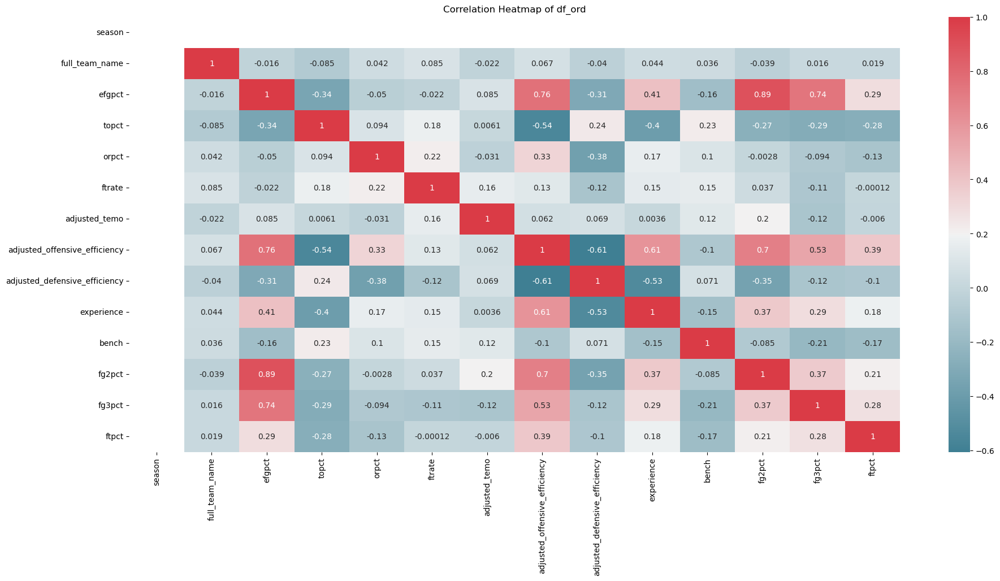

In [60]:
numerical_columns = df_ord.select_dtypes(include=[np.number])
corr = numerical_columns.corr()
plt.figure(figsize=(22, 10))
sns.heatmap(corr, cmap=sns.diverging_palette(220, 10, as_cmap=True), annot=True)
plt.title(label='Correlation Heatmap of df_ord')
plt.show()